## Entropy maps for Supplementary Figure (Fig. S4)

### Calculates entropy for individual subjects and group-averaged blueprints, and produces mean and variance maps

### Calculation of entropy maps across subjects require individual subject data siubject to data access agreements

##### Citation: Warrington*, Thompson*, Bastiani, Dubois, Baxter, Slater, Jbabdi, Mars, Sotiropoulos (bioRxiv), "Concurrent mapping of brain ontogeny and phylogeny within a common space"
##### Corresponding author: Shaun Warrington, shaun.warrington1@nottingham.ac.uk; Stamatios Sotiropoulos, Stamatios.Sotiropoulos@nottingham.ac.uk

In [1]:
import numpy as np
import nibabel as nib
from nibabel import cifti2
from numpy import matlib
import pandas as pd
import scipy
import seaborn as sns
import matplotlib 
import matplotlib.pyplot as plt
from surfplot import Plot

from tqdm.notebook import tqdm

# import warnings
# warnings.filterwarnings('ignore')

### Functions

In [2]:
# save data as CIFTI file
def data_to_cifti(data, fname, roi_left, roi_right=None):
    
    if data.ndim==1:
        data=np.expand_dims(data, axis=0)
    
    n,ctx=data.shape
    
    #set up cifti brain model axes
    bm_ctx_left = cifti2.BrainModelAxis.from_mask(roi_left, name="CortexLeft")
    
    if roi_right is not None:
        bm_ctx_right = cifti2.BrainModelAxis.from_mask(roi_right, name="CortexRight")
        bm = bm_ctx_left + bm_ctx_right 
        
    else :bm = bm_ctx_left
    sc = cifti2.ScalarAxis(np.arange(n).astype("str"))

    #save cifti
    hdr = cifti2.Cifti2Header.from_axes((sc,bm))
    img = cifti2.Cifti2Image(data, hdr)

    nib.save(img, fname)
    
# Remove contralateral tract data
def remove_contra(bp, tracts, n_left):
    tract_names = sorted(list(set([ x.split("_")[0] for x in tracts ])))
    
    bp_new = np.zeros((len(tract_names),bp.shape[1]))

    for i, t in enumerate(tracts):
        new_i = tract_names.index(t.split("_")[0])
        if len(t.split("_")) == 1:
            bp_new[new_i,:] = bp[i,:]
        
        elif t.split("_")[1] == "l":
            bp_new[new_i, :n_left] = bp[i, :n_left]
        
        elif t.split("_")[1] == "r":
            bp_new[new_i, n_left:] = bp[i, n_left:]
    
    #normalise
    #bp_new = bp_new / np.sum(bp_new, axis=0)
    
    return bp_new

# find the tract contribution at a particular vertex
def ctx2cifti(ctx_index, hemi, roi_l, roi_r, bp):
    
    idx = np.append(np.cumsum(roi_l)*roi_l, np.cumsum(roi_r)*roi_r+np.sum(roi_l))
    if hemi=="l":
        cifti_index = idx[ctx_index].astype(int)
    
    elif hemi=="r":
        cifti_index = idx[ctx_index + len(roi_l)].astype(int)

    plt.xticks(rotation=45, size="xx-small")
    plt.plot(tract_names,bp[:,cifti_index],marker=".")
    ax = plt.gca()
    ax.grid(axis='x')
    return cifti_index

# mask parcels out from dense blueprint
def mask_parc_from_dense(parc, data, lab, mac=False):
    parc_values = parc.get_fdata()[0]
    cifti_hdr = parc.header
    label_axis = cifti_hdr.get_axis(0)
    label_dict = label_axis.get_element(0)[1]

    def matchingKeys(dictionary, searchString):
        return [key for key,val in dictionary.items() if any(searchString in s for s in val)]
    
    for l in lab:
        mask = (parc_values == matchingKeys(label_dict, l)[0])
        if mac == True:
            mask = np.hstack((mask,np.zeros((data.shape[1]-parc_values.shape[0],), dtype=bool)))
            
        data[:,mask] = 0
    
    return data

# metric_paths can be single path or list of paths
# if it's a list, need to provide list of cbar_titles
def plot_surf(metric_paths, Lsurf_path, Rsurf_path, Lroi, Rroi, 
              cmap, color_range, title, plot_right=False, mean=None, sd=None, mac=False, cbar=True, cbar_title="",
             zoom=None):
    plt.rcParams['figure.dpi'] = 600
    if mac == True:
        plot_right=False
    if zoom == None:
        if plot_right == True:
            zoom=1.2
        else:
            zoom=1.8
    
    # prepare metric file
    def prep_metric(metric_path, Lroi, Rroi):
        metric = nib.load(metric_path)
        metric = np.asanyarray(metric.dataobj)

        # number of vertices in left ROI
        n_left = int(np.sum(Lroi))

        # get left and right
        metric_l = np.copy(Lroi)
        metric_l[metric_l==1] = metric[0,:n_left]
        if mac == False:
            metric_r = np.copy(Rroi)
            metric_r[metric_r==1] = metric[0,n_left:]
        else:
            metric_r = np.copy(metric_l)
        return metric_l, metric_r
    
    # get metric files
    if isinstance(metric_paths, list):
        metric = []
        for p in metric_paths:
            metric.append(prep_metric(p, Lroi, Rroi))
    else:
        metric = prep_metric(metric_paths, Lroi, Rroi)
    
    # build plot
    if plot_right == True:
        p = Plot(surf_lh=Lsurf_path, surf_rh=Rsurf_path, zoom=zoom, size=(800, 200), layout='row')
    else:
        p = Plot(surf_lh=Lsurf_path, zoom=zoom, size=(600, 200))

    # cbar options
    if cbar == True:
        kws = {'location': 'bottom', 'decimals': 1,
       'fontsize': 12, 'n_ticks': 3, 'shrink': 2, 'aspect': 12,
       'draw_border': False, 'pad': 0.1}
        if plot_right == True:
            if isinstance(metric_paths, list):
                for i, met in enumerate(metric):
                    p.add_layer({'left': met[0], 'right': met[1]}, zero_transparent=True,
                                cmap=cmap[i], color_range=color_range[i], cbar_label=cbar_title[i])
            else:
                    p.add_layer({'left': metric[0], 'right': metric[1]},
                                cmap=cmap, color_range=color_range, cbar_label=cbar_title)
        else:
            if isinstance(metric_paths, list):
                for i, met in enumerate(metric):
                    p.add_layer({'left': met[0]}, zero_transparent=True,
                                cmap=cmap[i], color_range=color_range[i], cbar_label=cbar_title[i])
            else:
                    p.add_layer({'left': metric[0]},
                                cmap=cmap, color_range=color_range, cbar_label=cbar_title)
                    
        fig = p.build(cbar_kws=kws)
    else:
        if plot_right == True:
            if isinstance(metric_paths, list):
                for i, met in enumerate(metric):
                    p.add_layer({'left': met[0], 'right': met[1]}, zero_transparent=True,
                                cmap=cmap[i], color_range=color_range[i], cbar=False)
            else:
                p.add_layer({'left': metric[0], 'right': metric[1]},
                            cmap=cmap, color_range=color_range, cbar=False)                
        else:
            if isinstance(metric_paths, list):
                for i, met in enumerate(metric):
                    p.add_layer({'left': met[0]}, zero_transparent=True,
                               cmap=cmap[i], color_range=color_range[i], cbar=False)
            else:
                p.add_layer({'left': metric[0]},
                           cmap=cmap, color_range=color_range, cbar=False)                
        
        fig = p.build()

    fig.axes[0].set_title(f'{title}\n', loc='left', fontsize=16, pad=1)
    if mean != None:
        fig.axes[0].annotate(f'(mean={mean}, s.d. {sd})', 
                             xy=(0.09,0.85), xycoords='figure fraction', ha='left', fontsize=12)
    
    plt.show()

### Some preproc

In [3]:
data_dir="/Users/shaunwarrington/Documents/baby_xtract_git/Data"
results_dir="/Users/shaunwarrington/Documents/baby_xtract_git/Results/bootstrap_results"
surf_dir="/Users/shaunwarrington/Documents/baby_xtract_git/Surfs"

#load ROIs
mac_roi_l = nib.load("{}/mac_atlasroi.resampled.L.shape.gii".format(surf_dir)).darrays[0].data
mac_roi_r = nib.load("{}/mac_atlasroi.resampled.R.shape.gii".format(surf_dir)).darrays[0].data

hum_roi_l = nib.load("{}/hum_atlasroi.resampled.L.shape.gii".format(surf_dir)).darrays[0].data
hum_roi_r = nib.load("{}/hum_atlasroi.resampled.R.shape.gii".format(surf_dir)).darrays[0].data

neo_roi_l = nib.load("{}/neo_atlasroi.resampled.L.func.gii".format(surf_dir)).darrays[0].data
neo_roi_r = nib.load("{}/neo_atlasroi.resampled.R.func.gii".format(surf_dir)).darrays[0].data

#load parcellations
neo_parc = nib.load("{}/neo_aparc.resampled.dlabel.nii".format(data_dir))
hum_parc = nib.load("{}/hum_aparc.resampled.dlabel.nii".format(data_dir))

hum_brod = nib.load("{}/hum_brod.resampled.dlabel.nii".format(data_dir))
mac_brod = nib.load("{}/mac_brod.resampled.dlabel.nii".format(data_dir))

# ROIs
mac_mask = np.concatenate((mac_roi_l, mac_roi_r))
hum_mask = np.concatenate((hum_roi_l, hum_roi_r))
neo_mask = np.concatenate((neo_roi_l, neo_roi_r))

# number of vertices in left surfaces
hum_n_left = int(hum_roi_l.sum())
neo_n_left = int(neo_roi_l.sum())
mac_n_left = int(mac_roi_l.sum())

# tract list
temp = nib.load(f'{data_dir}/ave_blueprint_hum.10k.dscalar.nii')
tracts = [temp.header.get_axis(i) for i in range(temp.ndim)][0]
tracts = [tracts.get_element(i)[0] for i in range (tracts.size)]

# parcels to mask out of dense blueprints
fs_mask_out = ["L_insula", "R_insula"] # DK
ba_mask_out = ["BA13", "BA14", "BA16", "BA26"] # Brodmann


In [4]:
# the FreeSurfer palette
# this palette comes from the standard freesurfer files
fs_label_dict = hum_parc.header.get_axis(0)[0]
fs_label_dict = pd.DataFrame.from_dict(fs_label_dict[1], orient='index', columns=['NAME', 'RGBA'])
fs_label_dict = fs_label_dict[fs_label_dict.NAME.str.contains("L_")] # remove right hemisphere labels

# the Brodmann-FreeSurfer matching and lobe colouring
# the custom FreeSurfer palette - i.e. lobe-based colouring

# built by manually selecting parcels that belong to given lobes and importing a new label table
cust_fs = nib.load("{}/hum_aparc_customcolour2.L.label.gii".format(data_dir))
table = cust_fs.labeltable

labels = [table.labels[i].label for i in range(len(table.labels))]
rgba = [table.labels[i].rgba for i in range(len(table.labels))]

custfs_label_dict = pd.DataFrame({'NAME': labels, 'RGBA': rgba})
custfs_label_dict.drop(index=[0, 1], axis=1, inplace=True)
custfs_label_dict.reset_index(inplace=True) # the label table for plotting

# add the freesurfer region
colour_dict = {(0.960784, 0.509804, 0.188235, 1.0): 'temporal',
                    (0.0, 0.0, 0.0, 0.882353): 'cingulate',
                    (0.0352941, 0.52549, 0.196078, 0.882353): 'frontal',
                    (0.470588, 0.27451, 0.196078, 1.0): 'ignore',
                    (0.0, 0.509804, 0.784314, 0.882353): 'occipital',
                    (0.294118, 0.196078, 0.490196, 1.0): 'parietal',
                    (1.0, 0.882353, 0.0980392, 1.0): 'insula',
                    (0.901961, 0.0980392, 0.294118, 1.0): 'sm'}

region_list = []
for index, row in custfs_label_dict.iterrows():
    r = list({v for (k,v) in colour_dict.items() if k == row.RGBA})[0]
    region_list.append(r)
    
custfs_label_dict['region'] = region_list


# BA colour matching
ba_matching_dict = pd.read_table("{}/ba_fs_matching.txt".format(data_dir), " ")

ba_colours = []
for i, row in ba_matching_dict.iterrows():
    ba_colours.append([k for k,v in colour_dict.items() if v == row.region][0])
    
ba_matching_dict["RGBA"] = ba_colours
ba_matching_dict["L_NAME"] = "L_" + ba_matching_dict["NAME"]

# remove data from bad parcels
fs_rm = ["-1", "???", "L_corpuscallosum", "R_corpuscallosum", "L_LABEL_-1", "R_LABEL_-1",
             "L_insula", "R_insula", "L_???", "R_???"]

ba_rm = ["???", "BA13", "BA14", "BA16", "BA26"]

for parc in fs_rm:
    fs_label_dict.drop(fs_label_dict[fs_label_dict.NAME == parc].index, inplace=True)
    custfs_label_dict.drop(custfs_label_dict[custfs_label_dict.NAME == parc].index, inplace=True)
    
for parc in ba_rm:
    ba_matching_dict.drop(ba_matching_dict[ba_matching_dict.NAME == parc].index, inplace=True)


/usr/local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3417: FutureWarning: In a future version of pandas all arguments of read_table except for the argument 'filepath_or_buffer' will be keyword-only.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [5]:
# Read subject lists
neolist = np.loadtxt(f'{data_dir}/ind_dhcp_blueprints/sublist', dtype='str')
hcplist = np.loadtxt(f'{data_dir}/ind_hcp_blueprints/sublist', dtype='str')
maclist = np.loadtxt(f'{data_dir}/ind_mac_blueprints/sublist', dtype='str')

ntests = 100
ntracts = 22

### Functions for entropy maps

In [6]:
# load blueprint
def loadbp(bppath, n_left, tracts, mask, parc, parc_maskout, macchk=False):
    bp = nib.load(bppath)
    bp = np.asanyarray(bp.dataobj)
    bp = bp[:,mask==1]
    bp = remove_contra(bp, tracts, n_left)
    bp = bp / np.sum(bp, axis=0)
    bp = mask_parc_from_dense(parc, bp, parc_maskout, mac=macchk)
    return bp

def entropy(bp):
    bp = bp / np.sum(bp, axis=0)
    entropy = -np.sum(bp*np.log2(bp + (bp == 0)), axis=0)
    return entropy

# subject-level entropy maps
def ind_entropy(sublist, n_left, roi_l, roi_r, mask, parc, datadir, parc_maskout, ntracts, macchk=False):
    for sub in tqdm(sublist):
        bp = loadbp(f"{datadir}/{sub}.dscalar.nii", n_left, tracts, mask, parc, parc_maskout, macchk=macchk)
        # entropy
        ent = entropy(bp)
        data_to_cifti(ent, f"{results_dir}/{sub}_entropy.dscalar.nii", roi_l, roi_r)
        
# Get the mean and variance of minKLD across runs
def get_ave(sublist, name, nvert, roi_l, roi_r, n_left):
    all_ent = np.zeros((nvert, ntests))
    for i, sub in tqdm(enumerate(sublist)):
        temp = nib.load(f"{results_dir}/{sub}_entropy.dscalar.nii")
        temp = np.asanyarray(temp.dataobj)
        all_ent[:,i] = temp

    # get mean and variance and save
    mn = np.mean(all_ent, 1)
    data_to_cifti(mn, f"{results_dir}/ave_{name}_ent.dscalar.nii", roi_l, roi_r)

    print(f'Mean across all vertices = {np.nanmean(mn[:n_left]):.3f}')

In [7]:
# neonate
ind_entropy(neolist, neo_n_left, neo_roi_l, neo_roi_r, neo_mask, neo_parc, 
            f"{data_dir}/ind_dhcp_blueprints", fs_mask_out, ntracts)

get_ave(neolist, 'dhcp', neo_mask[neo_mask==1].shape[0], neo_roi_l, neo_roi_r, neo_n_left)


<ipython-input-6-fe0a238e77cb>:12: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)
<ipython-input-6-fe0a238e77cb>:7: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)



Mean across all vertices = 0.679


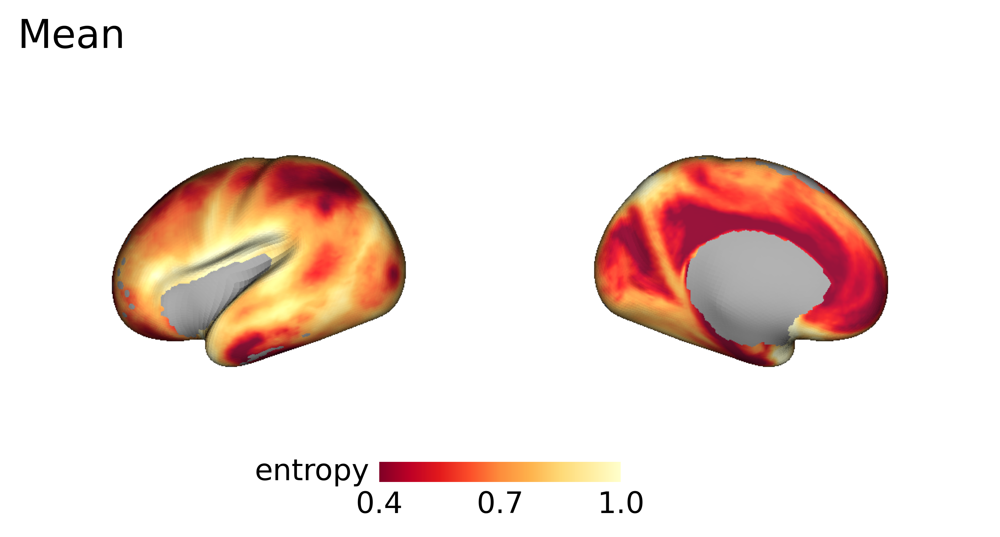

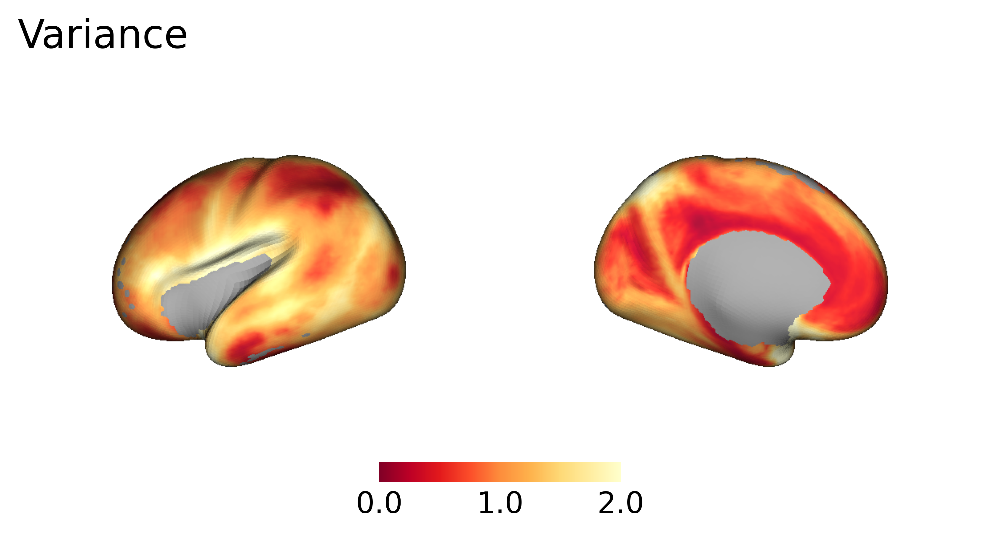

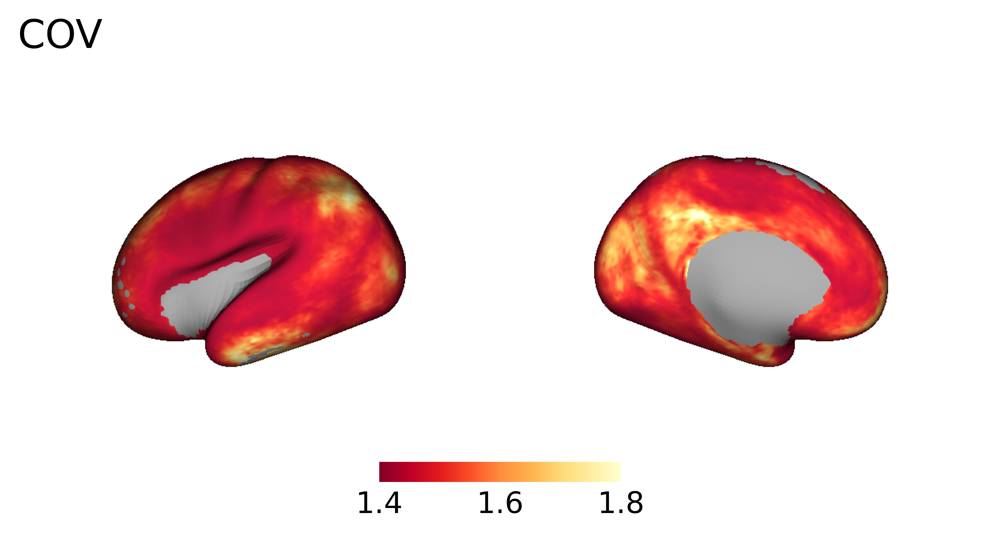

In [28]:
plot_surf(f'{results_dir}/ave_dhcp_ent.dscalar.nii', 
           f'{surf_dir}/L.rneo.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rneo.very_inflated.resampled.surf.gii',
           neo_roi_l, neo_roi_r, 'YlOrRd_r', [0.4, 1], 'Mean', 
           cbar_title="entropy", zoom=1.2)


In [9]:
# adult
ind_entropy(hcplist, hum_n_left, hum_roi_l, hum_roi_r, hum_mask, hum_parc, 
            f"{data_dir}/ind_hcp_blueprints", fs_mask_out, ntracts)

get_ave(hcplist, 'hcp', hum_mask[hum_mask==1].shape[0], hum_roi_l, hum_roi_r, hum_n_left)


<ipython-input-6-fe0a238e77cb>:7: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)
<ipython-input-6-fe0a238e77cb>:12: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)



Mean across all vertices = 1.207


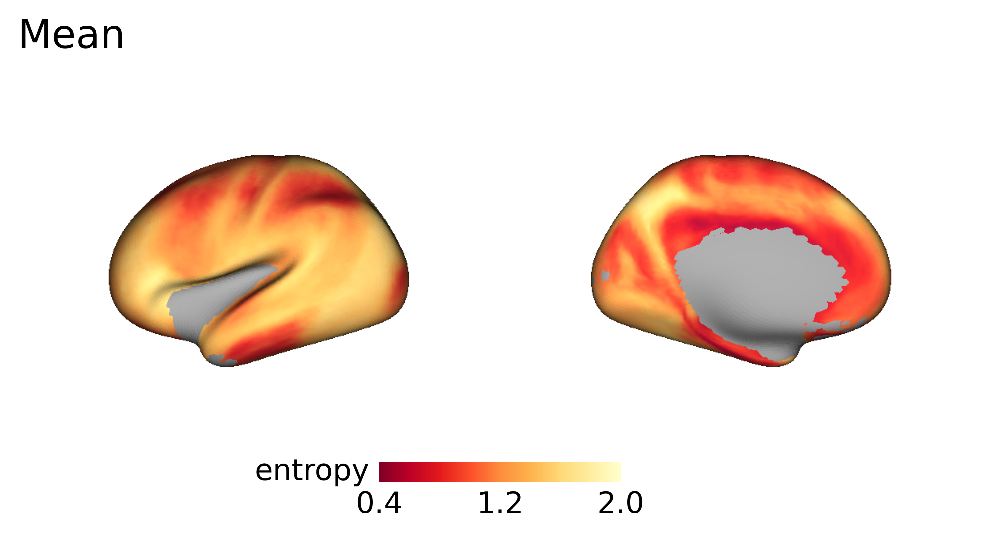

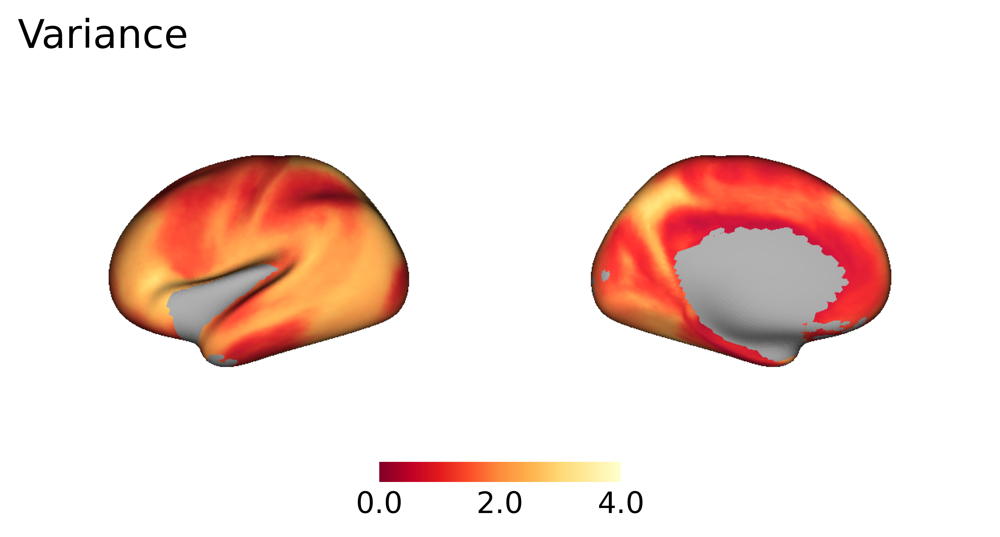

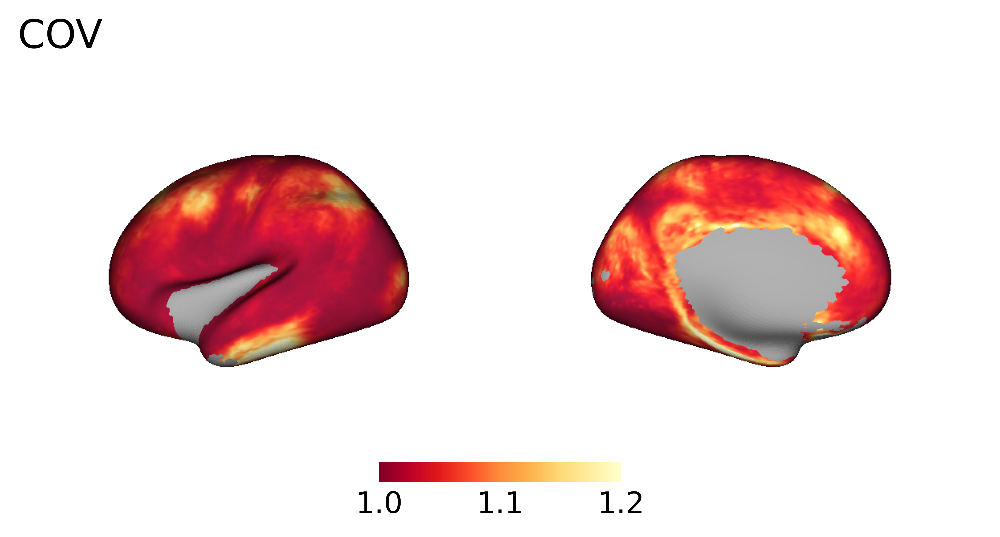

In [29]:
plot_surf(f'{results_dir}/ave_hcp_ent.dscalar.nii', 
           f'{surf_dir}/L.rhum.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rhum.very_inflated.resampled.surf.gii',
           hum_roi_l, hum_roi_r, 'YlOrRd_r', [0.4, 2], 'Mean', 
           cbar_title="entropy", zoom=1.2)


In [11]:
# macaque
ind_entropy(maclist, mac_n_left, mac_roi_l, mac_roi_r, mac_mask, mac_brod, 
            f"{data_dir}/ind_mac_blueprints", ba_mask_out, ntracts, macchk=True)

get_ave(maclist, 'mac', mac_mask[mac_mask==1].shape[0], mac_roi_l, mac_roi_r, mac_n_left)


<ipython-input-6-fe0a238e77cb>:7: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)
<ipython-input-6-fe0a238e77cb>:12: RuntimeWarning: invalid value encountered in true_divide
  bp = bp / np.sum(bp, axis=0)



Mean across all vertices = 0.133


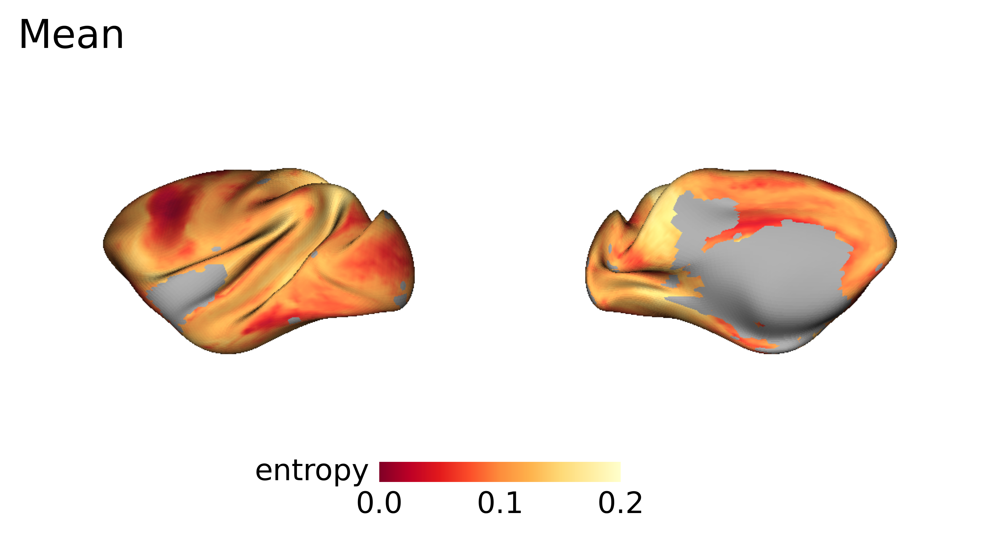

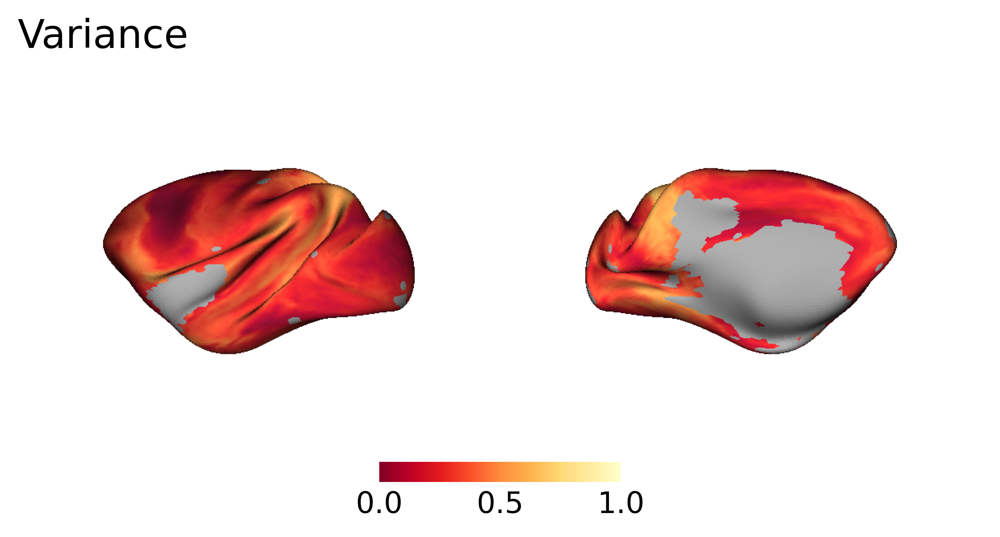

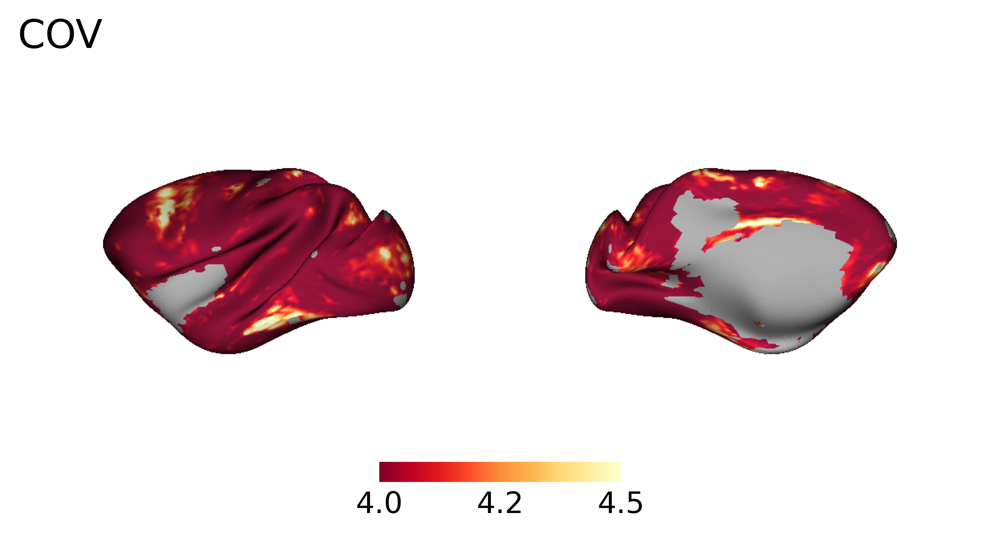

In [35]:
plot_surf(f'{results_dir}/ave_mac_ent.dscalar.nii', 
           f'{surf_dir}/L.rmac.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rmac.very_inflated.resampled.surf.gii',
           mac_roi_l, mac_roi_r, 'YlOrRd_r', [0, 0.25], 'Mean', 
           cbar_title="entropy", zoom=1.2)


### Entropy for group means

In [19]:
# load group-averaged data
hum_bp = loadbp(f"{data_dir}/ave_blueprint_hum.10k.dscalar.nii", 
                hum_n_left, tracts, hum_mask, hum_parc, fs_mask_out)

neo_bp = loadbp(f"{data_dir}/ave_neo_40w.LR.dscalar.nii", 
                neo_n_left, tracts, neo_mask, neo_parc, fs_mask_out)

mac_bp = loadbp(f"{data_dir}/ave_blueprint_mac.10k.dscalar.nii", 
                mac_n_left, tracts, mac_mask, mac_brod, ba_mask_out, macchk=True)

In [20]:
# get entropy maps
ent = entropy(hum_bp)
data_to_cifti(ent, f"{results_dir}/hum_manu_entropy.dscalar.nii", hum_roi_l, hum_roi_r)
print(f'Mean across all vertices = {np.nanmean(ent[:hum_n_left]):.3f}')

ent = entropy(neo_bp)
data_to_cifti(ent, f"{results_dir}/neo_manu_entropy.dscalar.nii", neo_roi_l, neo_roi_r)
print(f'Mean across all vertices = {np.nanmean(ent[:neo_n_left]):.3f}')


ent = entropy(mac_bp)
data_to_cifti(ent, f"{results_dir}/mac_manu_entropy.dscalar.nii", mac_roi_l, mac_roi_r)
print(f'Mean across all vertices = {np.nanmean(ent[:mac_n_left]):.3f}')

Mean across all vertices = 2.692
Mean across all vertices = 2.389
Mean across all vertices = 2.391


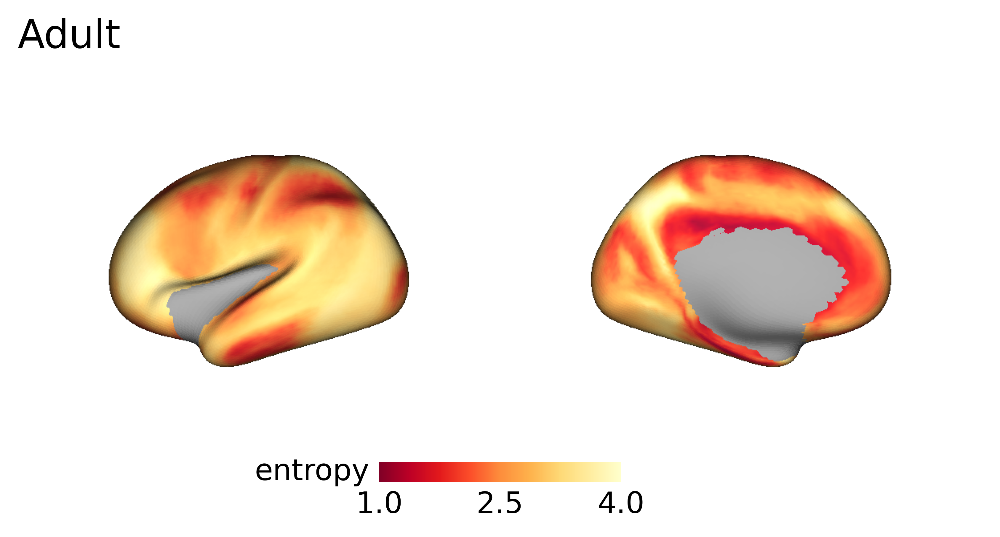

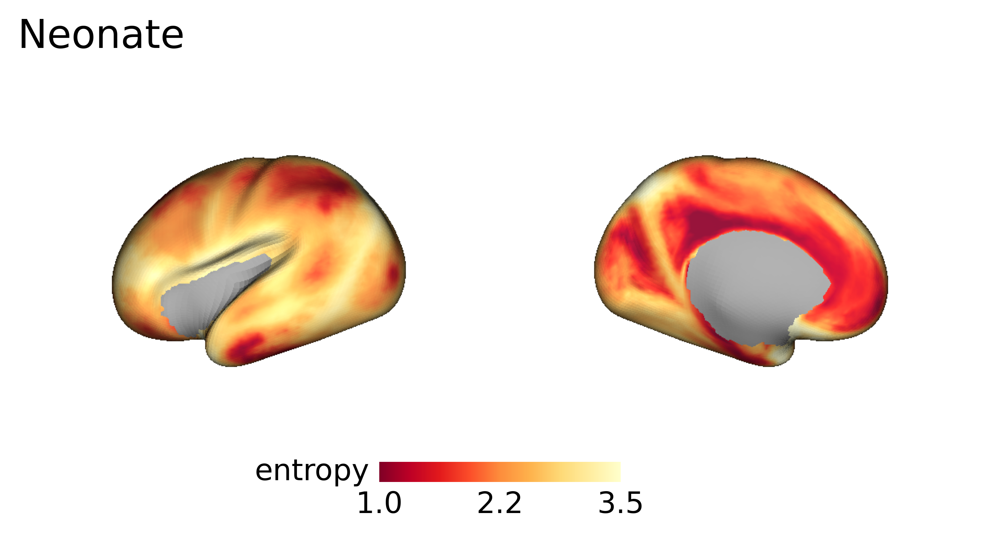

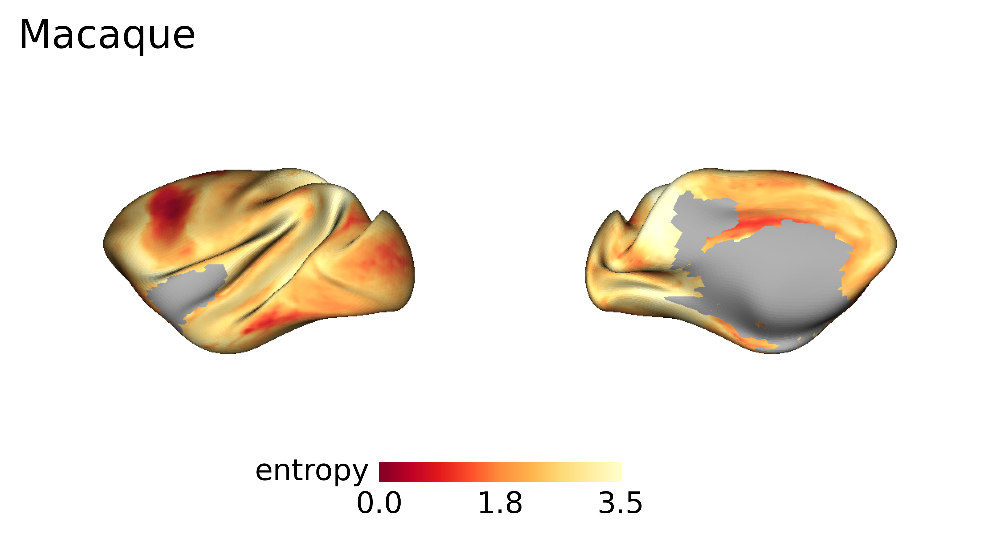

In [21]:
plot_surf(f'{results_dir}/hum_manu_entropy.dscalar.nii', 
           f'{surf_dir}/L.rhum.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rhum.very_inflated.resampled.surf.gii',
           hum_roi_l, hum_roi_r, 'YlOrRd_r', [1, 4], 'Adult', 
           cbar_title="entropy", zoom=1.2)

plot_surf(f'{results_dir}/neo_manu_entropy.dscalar.nii', 
           f'{surf_dir}/L.rneo.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rneo.very_inflated.resampled.surf.gii',
           neo_roi_l, neo_roi_r, 'YlOrRd_r', [1, 3.5], 'Neonate', 
           cbar_title="entropy", zoom=1.2)

plot_surf(f'{results_dir}/mac_manu_entropy.dscalar.nii', 
           f'{surf_dir}/L.rmac.very_inflated.resampled.surf.gii', 
           f'{surf_dir}/R.rmac.very_inflated.resampled.surf.gii',
           mac_roi_l, mac_roi_r, 'YlOrRd_r', [0, 3.5], 'Macaque', 
           cbar_title="entropy", zoom=1.2)